# Разделительная кластеризация

In [1]:
from sklearn import datasets
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings("ignore")

In [58]:
# импортируем набор данных
df = pd.read_csv('housing.csv')
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


In [117]:
df = df.dropna()

In [118]:
X = df.iloc[:, [8, 2, 1, 0]].values
X

array([[ 4.5260e+05,  4.1000e+01,  3.7880e+01, -1.2223e+02],
       [ 3.5850e+05,  2.1000e+01,  3.7860e+01, -1.2222e+02],
       [ 3.5210e+05,  5.2000e+01,  3.7850e+01, -1.2224e+02],
       ...,
       [ 9.2300e+04,  1.7000e+01,  3.9430e+01, -1.2122e+02],
       [ 8.4700e+04,  1.8000e+01,  3.9430e+01, -1.2132e+02],
       [ 8.9400e+04,  1.6000e+01,  3.9370e+01, -1.2124e+02]])

In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20433 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20433 non-null  float64
 1   latitude            20433 non-null  float64
 2   housing_median_age  20433 non-null  float64
 3   total_rooms         20433 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20433 non-null  float64
 6   households          20433 non-null  float64
 7   median_income       20433 non-null  float64
 8   median_house_value  20433 non-null  float64
 9   ocean_proximity     20433 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.7+ MB


In [62]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20433.000000,20433.000000,20433.000000,20433.000000,20433.000000,20433.000000,20433.000000,20433.000000,20433.000000
mean,-119.570689,35.633221,28.633094,2636.504233,537.870553,1424.946949,499.433465,3.871162,206864.413155
std,2.003578,2.136348,12.591805,2185.269567,421.385070,1133.208490,382.299226,1.899291,115435.667099
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1450.000000,296.000000,787.000000,280.000000,2.563700,119500.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.536500,179700.000000
75%,-118.010000,37.720000,37.000000,3143.000000,647.000000,1722.000000,604.000000,4.744000,264700.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [63]:
df.ocean_proximity.unique()

array(['NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'ISLAND'],
      dtype=object)

In [64]:
df.ocean_proximity.value_counts()

<1H OCEAN     9034
INLAND        6496
NEAR OCEAN    2628
NEAR BAY      2270
ISLAND           5
Name: ocean_proximity, dtype: int64

In [65]:
df.isnull().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64

In [66]:
# correl=df.corr()
# sns.heatmap(correl,annot=True)

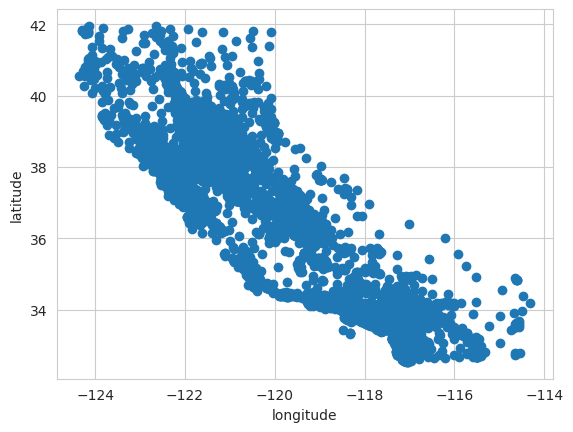

In [67]:
x_axis = df.longitude.values 
y_axis = df.latitude.values 

plt.xlabel(df.columns.values[0])
plt.ylabel(df.columns.values[1])
plt.scatter(x_axis, y_axis)
plt.show()

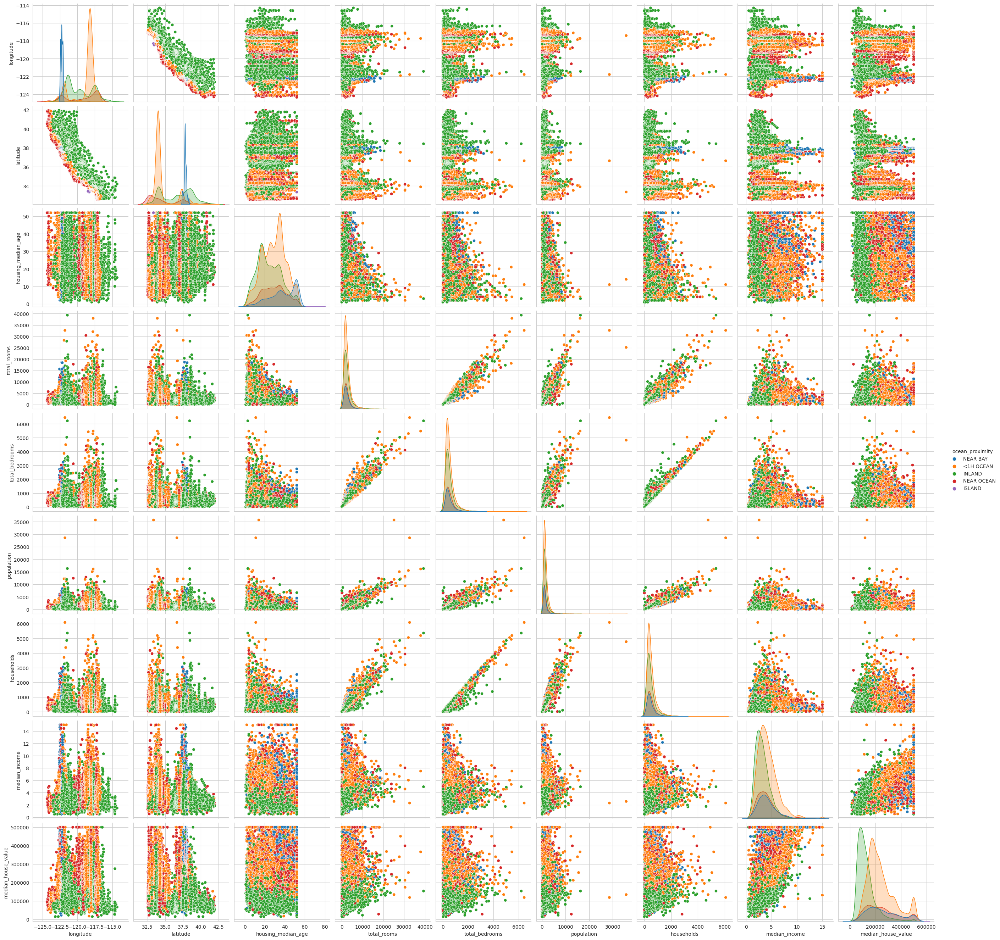

In [68]:
import seaborn as sns

sns.set_style("whitegrid")
sns.pairplot(df,hue="ocean_proximity",size=3);
plt.show()

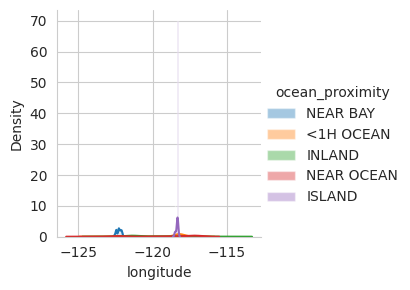

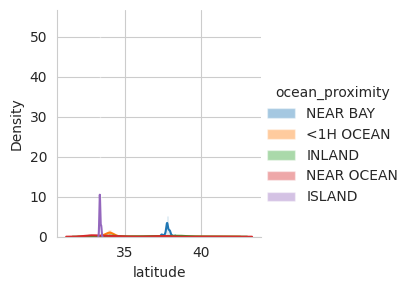

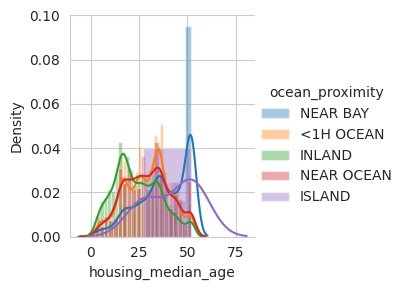

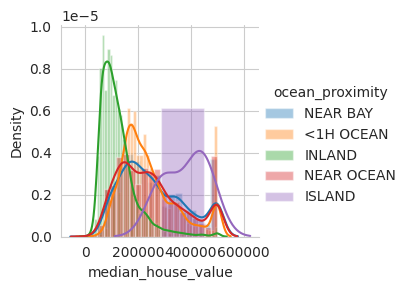

In [69]:
sns.FacetGrid(df,hue="ocean_proximity").map(sns.distplot,"longitude").add_legend()
sns.FacetGrid(df,hue="ocean_proximity").map(sns.distplot,"latitude").add_legend()
sns.FacetGrid(df,hue="ocean_proximity").map(sns.distplot,"housing_median_age").add_legend()
sns.FacetGrid(df,hue="ocean_proximity").map(sns.distplot,"median_house_value").add_legend()

plt.show()

In [70]:
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


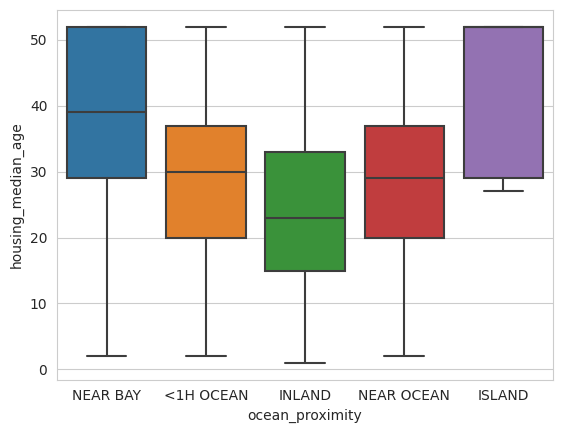

In [71]:
sns.boxplot(x="ocean_proximity",y="housing_median_age",data=df)
plt.show()

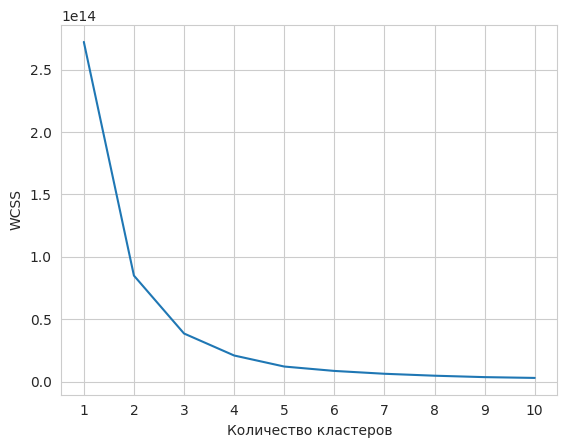

In [72]:
from sklearn.cluster import KMeans

wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=1)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.xticks(range(1, 11))
plt.xlabel("Количество кластеров")
plt.ylabel("WCSS")
plt.show()

In [120]:
kmeans = KMeans(n_clusters = 5,
#                 max_iter = 300, попробовать другие гиперпараметры
                random_state = 1)

y_kmeans = kmeans.fit_predict(X)

In [121]:
y_kmeans

array([4, 1, 1, ..., 3, 3, 3], dtype=int32)

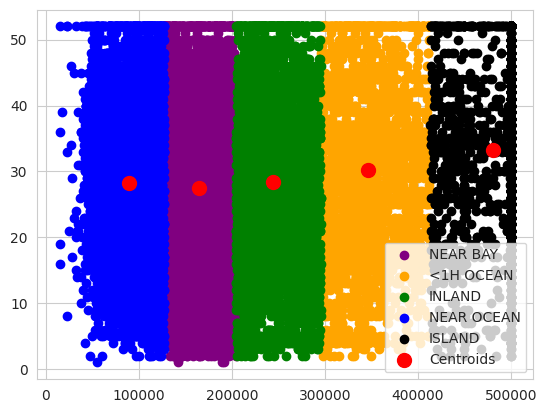

In [122]:
plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], c = 'purple', label = 'NEAR BAY')
plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], c = 'orange', label = '<1H OCEAN')
plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], c = 'green', label = 'INLAND')
plt.scatter(X[y_kmeans == 3, 0], X[y_kmeans == 3, 1], c = 'blue', label = 'NEAR OCEAN')
plt.scatter(X[y_kmeans == 4, 0], X[y_kmeans == 4, 1], c = 'black', label = 'ISLAND')


# Plotting 
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:,1], s = 100, c = 'red', label = 'Centroids')

plt.legend()

In [123]:
kmeans = KMeans(n_clusters = 4,
#                 max_iter = 300, попробовать другие гиперпараметры
                random_state = 1)

y_kmeans = kmeans.fit_predict(X)

In [124]:
y_kmeans

array([2, 1, 1, ..., 3, 3, 3], dtype=int32)

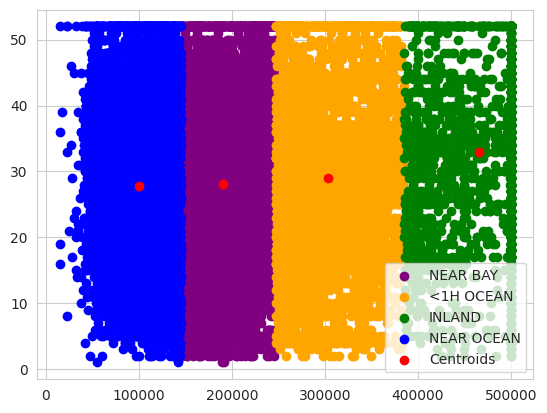

In [125]:
plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], c = 'purple', label = 'NEAR BAY')
plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], c = 'orange', label = '<1H OCEAN')
plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], c = 'green', label = 'INLAND')
plt.scatter(X[y_kmeans == 3, 0], X[y_kmeans == 3, 1], c = 'blue', label = 'NEAR OCEAN')


#Plotting
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:,1], c = 'red', label = 'Centroids')

plt.legend()

In [126]:
kmeans = KMeans(n_clusters = 3,
#                 max_iter = 300, попробовать другие гиперпараметры
                random_state = 1)

y_kmeans = kmeans.fit_predict(X)

In [127]:
y_kmeans

array([1, 1, 1, ..., 2, 2, 2], dtype=int32)

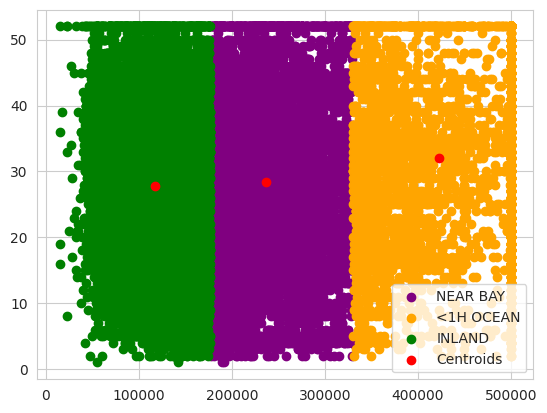

In [128]:
plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], c = 'purple', label = 'NEAR BAY')
plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], c = 'orange', label = '<1H OCEAN')
plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], c = 'green', label = 'INLAND')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:,1], c = 'red', label = 'Centroids')

plt.legend()

2. Внесите шум в набор данных (случайным образом изменить определенную долю объектов набора: 1%, 3%, 5%, 10%; изменение может заключаться в добавлении/вычитании к/из одной/нескольких координат объекта случайного числа). Выполните кластеризацию зашумленного набора данных с помощью алгоритмов k‑Means и k‑Medoids (или PAM), используя различные значения параметра  (из интервала 3..9). Выполните визуализацию полученных результатов в виде точечных графиков, на которых цвет точки отражает принадлежность кластеру.

In [82]:
change = df.sample(50).index
change

Int64Index([18601, 15660, 14703,   967,  6149, 17972,  3956,  7371, 13554,
            15852,  9762, 17239, 14157,  9427,  9522,  6181, 17268,  1870,
             4024, 13796, 10902, 14212, 18349, 18451,  7978, 20508,  6655,
            19714,  6110,  2754, 12976, 15978, 15172,  8456,   370, 12348,
            12471,  6479, 14146, 15583,  5481,  5743, 12059,  7853,  6283,
            12820, 17481, 20441,  5553, 11585],
           dtype='int64')

In [83]:
df.loc[change,'median_house_value'] = df.loc[change,'median_house_value']*1.1


In [97]:
X = df.iloc[:, [8, 2, 1, 0]].values
X

array([[ 4.5260e+05,  4.1000e+01,  3.7880e+01, -1.2223e+02],
       [ 3.5850e+05,  2.1000e+01,  3.7860e+01, -1.2222e+02],
       [ 3.5210e+05,  5.2000e+01,  3.7850e+01, -1.2224e+02],
       ...,
       [ 9.2300e+04,  1.7000e+01,  3.9430e+01, -1.2122e+02],
       [ 8.4700e+04,  1.8000e+01,  3.9430e+01, -1.2132e+02],
       [ 8.9400e+04,  1.6000e+01,  3.9370e+01, -1.2124e+02]])

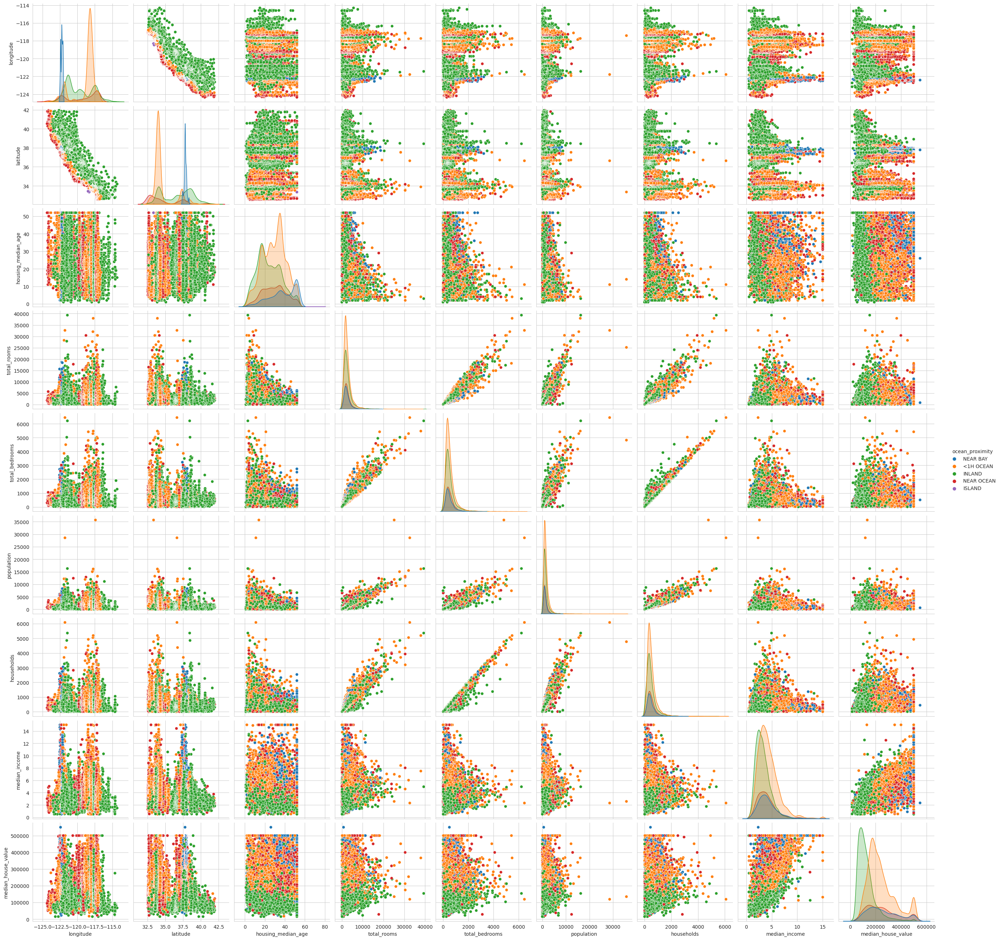

In [85]:
import seaborn as sns

sns.set_style("whitegrid")
sns.pairplot(df,hue="ocean_proximity",size=3);
plt.show()

In [129]:
kmeans = KMeans(n_clusters = 5,
#                 max_iter = 300, попробовать другие гиперпараметры
                random_state = 1)

y_kmeans = kmeans.fit_predict(X)

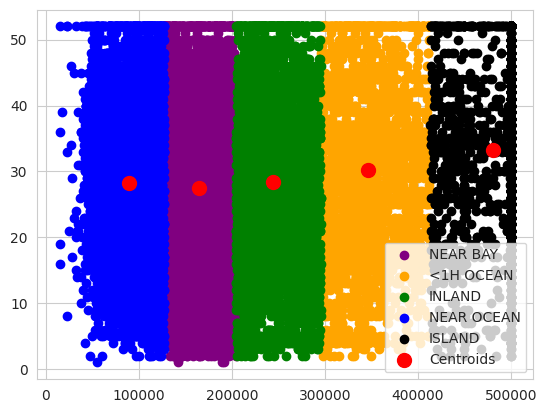

In [130]:
plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], c = 'purple', label = 'NEAR BAY')
plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], c = 'orange', label = '<1H OCEAN')
plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], c = 'green', label = 'INLAND')
plt.scatter(X[y_kmeans == 3, 0], X[y_kmeans == 3, 1], c = 'blue', label = 'NEAR OCEAN')
plt.scatter(X[y_kmeans == 4, 0], X[y_kmeans == 4, 1], c = 'black', label = 'ISLAND')


# Plotting 
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:,1], s = 100, c = 'red', label = 'Centroids')

plt.legend()

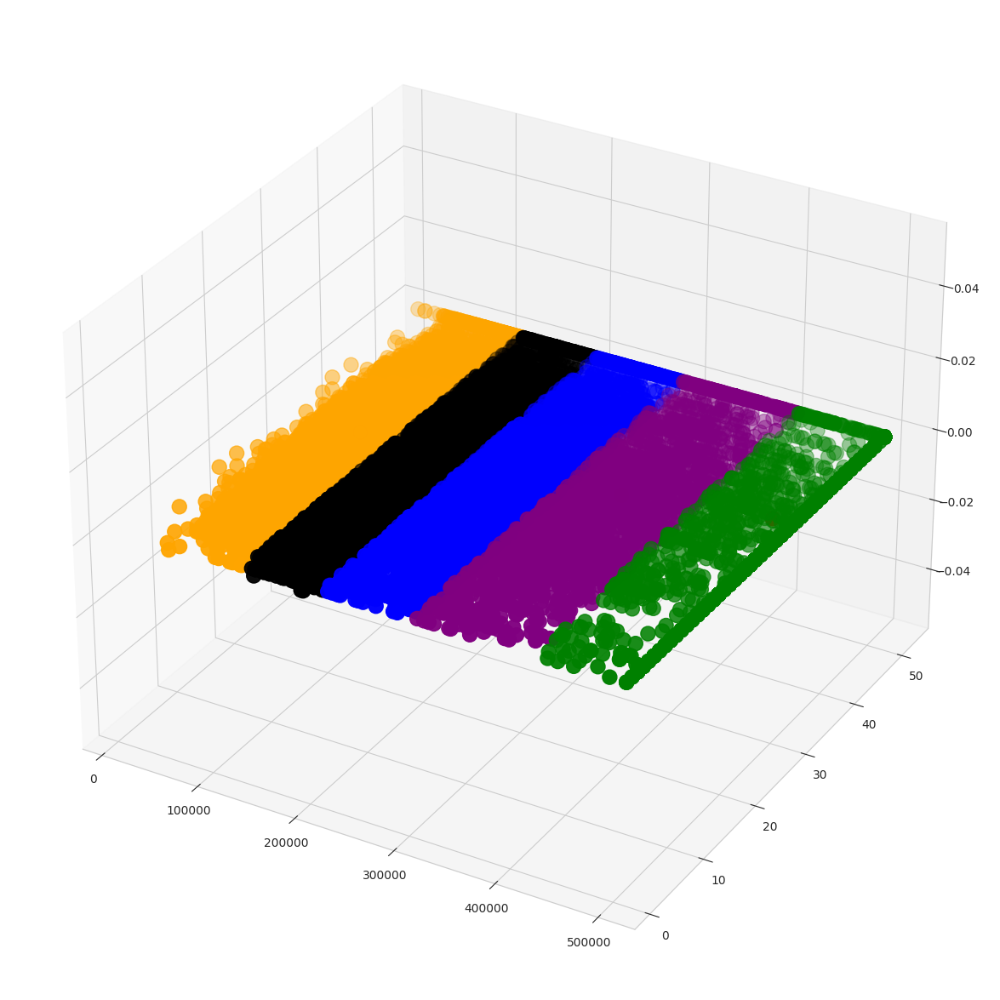

In [112]:
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(111, projection='3d')

plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], s=150, c = 'purple', label = 'NEAR BAY')
plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], s=150, c = 'orange', label = '<1H OCEAN')
plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], s=150, c = 'green', label = 'INLAND')
plt.scatter(X[y_kmeans == 3, 0], X[y_kmeans == 3, 1], s=150, c = 'blue', label = 'NEAR OCEAN')
plt.scatter(X[y_kmeans == 4, 0], X[y_kmeans == 4, 1], s=150, c = 'black', label = 'ISLAND')

# Plotting
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[
            :, 1], s=150, c='red', label='Centroids')

plt.show()

In [90]:
!pip install scikit-learn-extra
from sklearn_extra.cluster import KMedoids

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 27.3 MB/s eta 0:00:00


In [92]:
cobj = KMedoids(n_clusters=5).fit(X)
labels = cobj.labels_

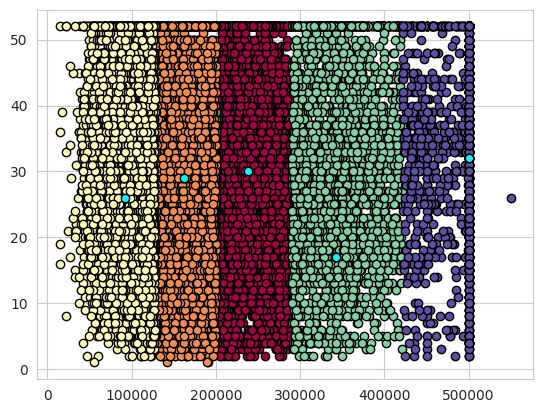

In [93]:
unique_labels = set(labels)
colors = [
    plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))
]
for k, col in zip(unique_labels, colors):
    class_member_mask = labels == k

    xy = X[class_member_mask]
    plt.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=6,
    )

plt.plot(
    cobj.cluster_centers_[:, 0],
    cobj.cluster_centers_[:, 1],
    "o",
    markerfacecolor="cyan",
    markeredgecolor="k",
    markersize=6,
)


3. Выполните кластеризацию набора данных из задания о плотностной кластеризации (с невыпуклыми кластерами) с помощью алгоритмов k‑Means и k‑Medoids (или PAM), используя различные значения параметра  (из интервала 3..9). Выполните визуализацию полученных результатов в виде точечных графиков, на которых цвет точки отражает принадлежность кластеру.

In [102]:
df = pd.read_csv('housing.csv')
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


In [103]:
X = df.iloc[:, [8, 2, 1, 0]].values
X

array([[ 4.5260e+05,  4.1000e+01,  3.7880e+01, -1.2223e+02],
       [ 3.5850e+05,  2.1000e+01,  3.7860e+01, -1.2222e+02],
       [ 3.5210e+05,  5.2000e+01,  3.7850e+01, -1.2224e+02],
       ...,
       [ 9.2300e+04,  1.7000e+01,  3.9430e+01, -1.2122e+02],
       [ 8.4700e+04,  1.8000e+01,  3.9430e+01, -1.2132e+02],
       [ 8.9400e+04,  1.6000e+01,  3.9370e+01, -1.2124e+02]])

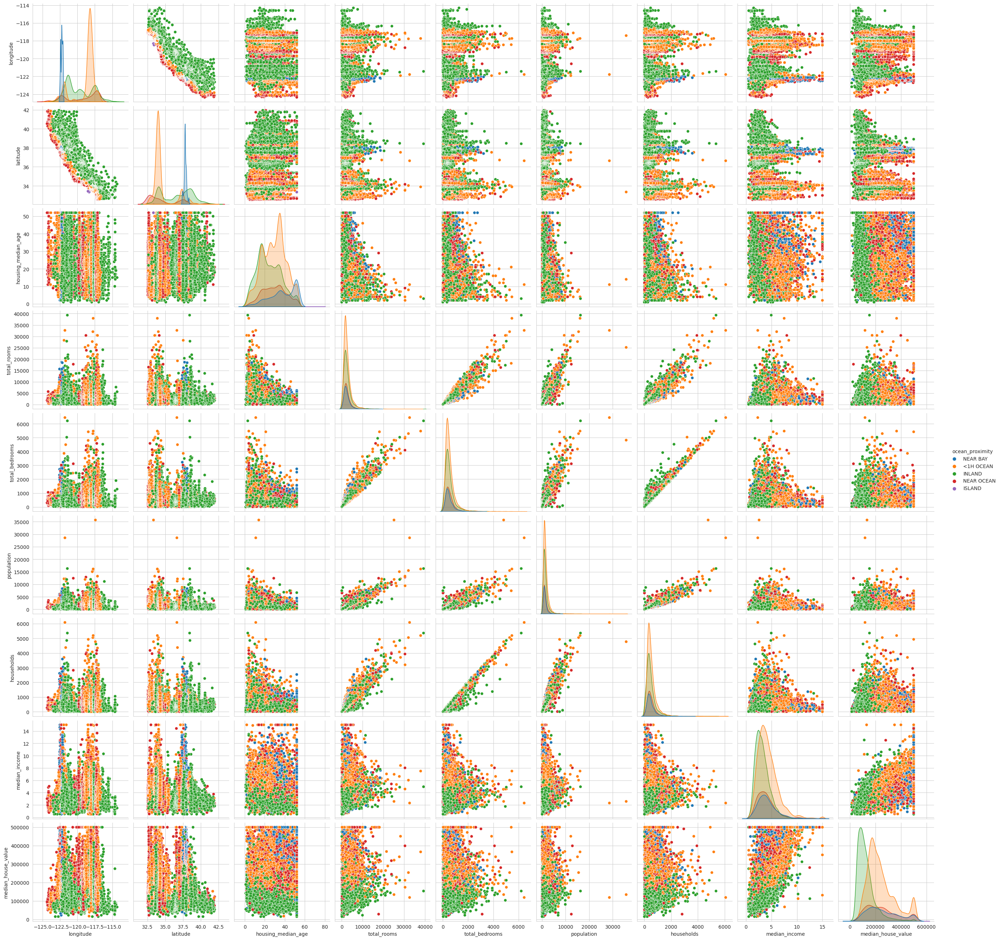

In [104]:
import seaborn as sns

sns.set_style("whitegrid")
sns.pairplot(df,hue="ocean_proximity",size=3);
plt.show()

In [105]:
kmeans = KMeans(n_clusters = 5,
#                 max_iter = 300, попробовать другие гиперпараметры
                random_state = 1)

y_kmeans = kmeans.fit_predict(X)

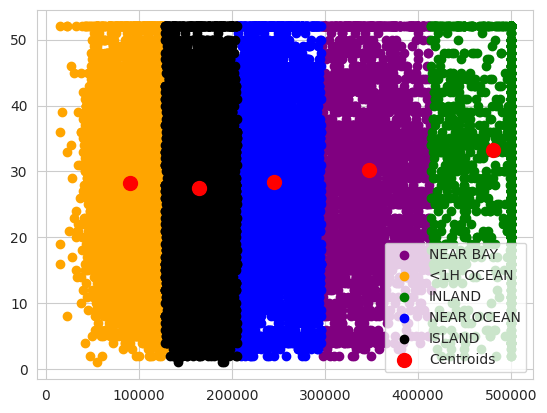

In [106]:
plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], c = 'purple', label = 'NEAR BAY')
plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], c = 'orange', label = '<1H OCEAN')
plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], c = 'green', label = 'INLAND')
plt.scatter(X[y_kmeans == 3, 0], X[y_kmeans == 3, 1], c = 'blue', label = 'NEAR OCEAN')
plt.scatter(X[y_kmeans == 4, 0], X[y_kmeans == 4, 1], c = 'black', label = 'ISLAND')


# Plotting 
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:,1], s = 100, c = 'red', label = 'Centroids')

plt.legend()

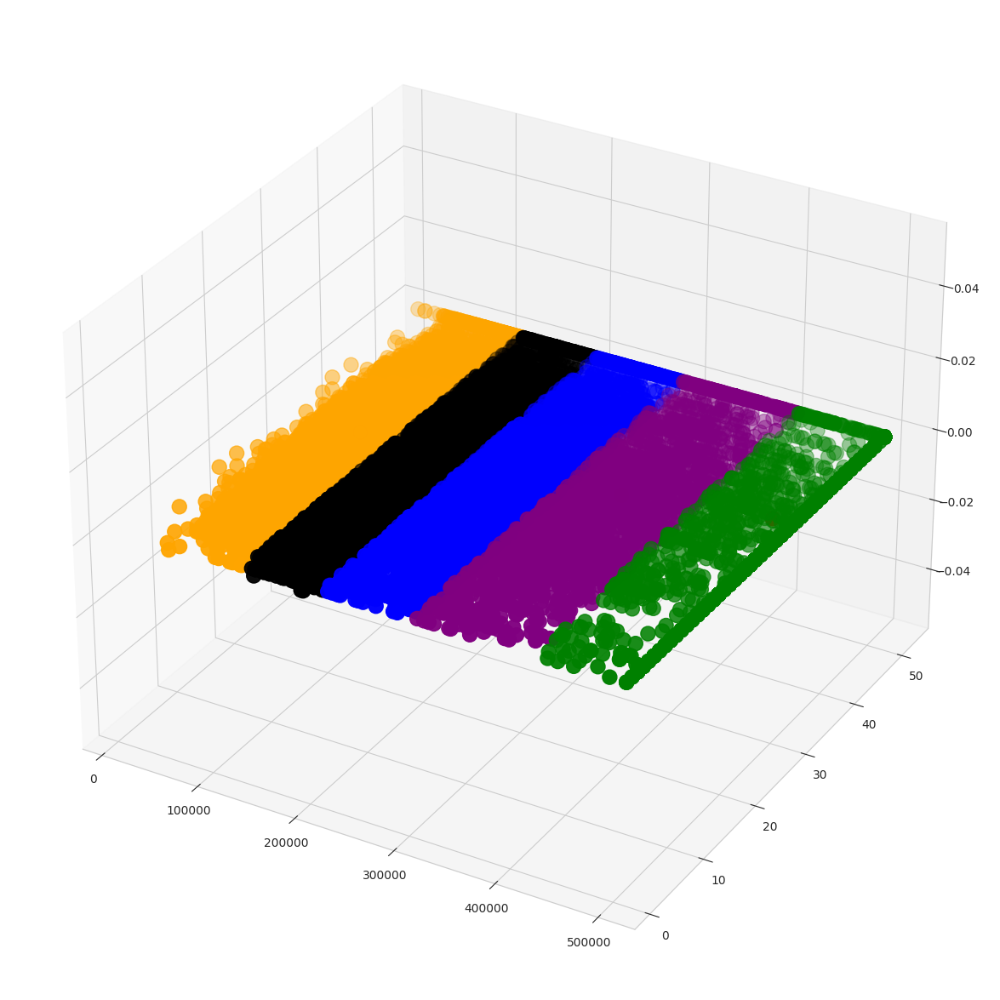

In [107]:
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(111, projection='3d')

plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], s=150, c = 'purple', label = 'NEAR BAY')
plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], s=150, c = 'orange', label = '<1H OCEAN')
plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], s=150, c = 'green', label = 'INLAND')
plt.scatter(X[y_kmeans == 3, 0], X[y_kmeans == 3, 1], s=150, c = 'blue', label = 'NEAR OCEAN')
plt.scatter(X[y_kmeans == 4, 0], X[y_kmeans == 4, 1], s=150, c = 'black', label = 'ISLAND')

# Plotting
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[
            :, 1], s=150, c='red', label='Centroids')

plt.show()

In [108]:
cobj = KMedoids(n_clusters=5).fit(X)
labels = cobj.labels_

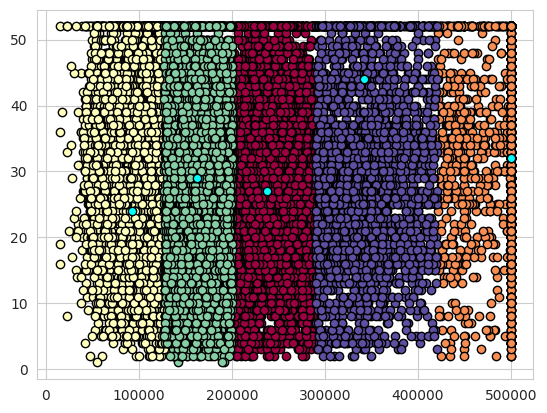

In [109]:
unique_labels = set(labels)
colors = [
    plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))
]
for k, col in zip(unique_labels, colors):
    class_member_mask = labels == k

    xy = X[class_member_mask]
    plt.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=6,
    )

plt.plot(
    cobj.cluster_centers_[:, 0],
    cobj.cluster_centers_[:, 1],
    "o",
    markerfacecolor="cyan",
    markeredgecolor="k",
    markersize=6,
)